 #                                            SuperMarket_Project(Data science)

### **Made By:Lyana Murad** 

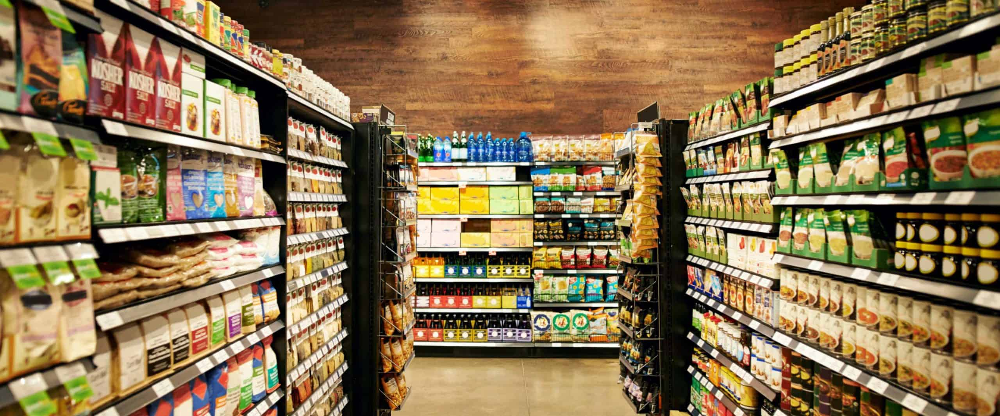

**Import Libreries**

In [109]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error,mean_absolute_error, r2_score
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor


**Read_CSV(Data)**

In [110]:
data=pd.read_csv('C:/Users/NTC/Desktop/analyses/supermarket_sales.csv')


#### **Exploring Data**

**The data contains 19 columns, which means there are 19 features**

Here’s an explanation of each column in your dataset:

Invoice ID: A unique identifier for each transaction or purchase invoice. This is likely a string or alphanumeric code used to track individual sales transactions.

Branch: The branch or location of the business where the sale took place. This could be a specific store or division within a company.

City: The city where the sale occurred. It might be used to analyze geographic sales performance.

Customer type: The type of customer making the purchase, e.g., whether they are a "New" or "Returning" customer. This could help in analyzing loyalty or customer segmentation.

Gender: The gender of the customer. It could be used to analyze purchasing behavior by gender.

Product line: The category or type of product sold, such as "Electronics," "Clothing," or "Furniture." This is a categorical variable used to group sales by product type.

Unit price: The price of one unit of the product sold. This is a numerical feature representing the cost per unit before any discounts, taxes, or other factors.

Quantity: The number of units of the product sold in that particular transaction. A numerical feature that can be multiplied by the unit price to calculate total sales.

Tax 5%: The amount of tax applied to the transaction, calculated at a 5% rate. This is a numerical feature reflecting the tax charged.

Total: The total amount of the sale, which is typically the product of the unit price, quantity, and taxes. It represents the total payment collected from the customer.

Date: The date when the transaction occurred. It helps track when sales happen and allows for time-based analysis (e.g., daily, weekly, monthly).

Time: The specific time of day when the transaction occurred. This can help analyze sales trends during different hours of the day.

Payment: The payment method used by the customer, such as "Cash," "Credit Card," or "Debit Card." It’s a categorical variable for payment mode analysis.

cogs (Cost of Goods Sold): The cost to the company of producing the goods sold in the transaction. This helps in calculating profitability by subtracting from revenue (Total).

gross margin percentage: The percentage of the total sale price that represents the gross profit (revenue - cost of goods sold). It helps assess how much profit the company makes on its sales.

gross income: The total profit made from the transaction before subtracting operating expenses, taxes, or interest. It is often derived from subtracting cogs from total sales.

Rating: The customer’s rating of the product or service, typically on a scale (e.g., 1-5). This can be used for customer satisfaction analysis or product feedback.

Hour: The hour of the day when the transaction took place, derived from the "Time" column. It helps in analyzing sales trends at different times of the day.

Month: The month in which the transaction occurred, derived from the "Date" column. This is useful for monthly sales trends and seasonality analysis.

These columns provide a comprehensive view of sales data and can be used for various types of analysis, including sales performance, customer behavior, profitability, and trends over time.

In [111]:
data.columns

Index(['Invoice ID', 'Branch', 'City', 'Customer type', 'Gender',
       'Product line', 'Unit price', 'Quantity', 'Tax 5%', 'Total', 'Date',
       'Time', 'Payment', 'cogs', 'gross margin percentage', 'gross income',
       'Rating'],
      dtype='object')

In [112]:
data.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,1/5/2019,13:08,Ewallet,522.83,4.761905,26.1415,9.1
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,3/8/2019,10:29,Cash,76.40,4.761905,3.8200,9.6
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,3/3/2019,13:23,Credit card,324.31,4.761905,16.2155,7.4
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,1/27/2019,20:33,Ewallet,465.76,4.761905,23.2880,8.4
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2/8/2019,10:37,Ewallet,604.17,4.761905,30.2085,5.3


**Information About Data**

In [113]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Invoice ID               1000 non-null   object 
 1   Branch                   1000 non-null   object 
 2   City                     1000 non-null   object 
 3   Customer type            1000 non-null   object 
 4   Gender                   1000 non-null   object 
 5   Product line             1000 non-null   object 
 6   Unit price               1000 non-null   float64
 7   Quantity                 1000 non-null   int64  
 8   Tax 5%                   1000 non-null   float64
 9   Total                    1000 non-null   float64
 10  Date                     1000 non-null   object 
 11  Time                     1000 non-null   object 
 12  Payment                  1000 non-null   object 
 13  cogs                     1000 non-null   float64
 14  gross margin percentage  

_________________________________________________________________________________________________________________________________________________

#### **Analysis**

**Missing_values**

therse no missing values

In [114]:
data.isnull().sum()

Invoice ID                 0
Branch                     0
City                       0
Customer type              0
Gender                     0
Product line               0
Unit price                 0
Quantity                   0
Tax 5%                     0
Total                      0
Date                       0
Time                       0
Payment                    0
cogs                       0
gross margin percentage    0
gross income               0
Rating                     0
dtype: int64

**Branch**

The counts across the three branches are relatively close, suggesting a roughly balanced distribution, but there are still slight variations.

**Hypotheses:**

**Branch Performance Hypothesis:** The difference in counts may reflect varying performance levels or market reach of each branch, with Branch A potentially performing slightly better than the others.

**Location Influence Hypothesis:** The count differences may be influenced by branch location, with Branch A possibly situated in a more populous or high-demand area.

**Operational Efficiency Hypothesis:** Branch C’s lower count could be due to operational inefficiencies or resource limitations compared to Branches A and B.

**Demand Variation Hypothesis:** Customer demand may differ slightly among branches due to factors like service offerings, pricing strategies, or customer preferences.

**Statistical Variation Hypothesis:** The counts may represent natural statistical variation without significant operational implications, indicating that all branches are performing at similar levels within a typical range of variability.

In [115]:
branch_counts=data.Branch.value_counts(dropna=False).sort_values()
branch_counts

Branch
C    328
B    332
A    340
Name: count, dtype: int64

C:\Users\NTC\AppData\Local\Temp\ipykernel_13900\119718356.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=branch_counts.index, y=branch_counts.values,palette='viridis')


<function matplotlib.pyplot.show(close=None, block=None)>

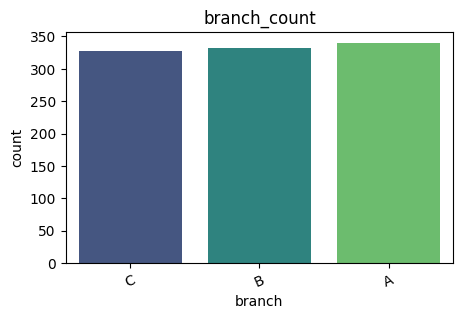

In [116]:
plt.figure(figsize=(5,3))
sns.barplot(x=branch_counts.index, y=branch_counts.values,palette='viridis')
plt.xlabel('branch')
plt.ylabel('count')
plt.title('branch_count')
plt.xticks(rotation=24)
plt.show

**City**

he data shows the counts for three cities:

Yangon has the highest count, indicating it is the most represented city in the dataset.
Mandalay follows closely, slightly lower than Yangon, but still a significant portion of the dataset.
Naypyitaw has the lowest count, which is just a little behind Mandalay.

In [117]:
City_counts=data.City.value_counts().sort_values()
City_counts

City
Naypyitaw    328
Mandalay     332
Yangon       340
Name: count, dtype: int64

C:\Users\NTC\AppData\Local\Temp\ipykernel_13900\31981395.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=City_counts.index, y=City_counts.values, palette="RdYlGn")


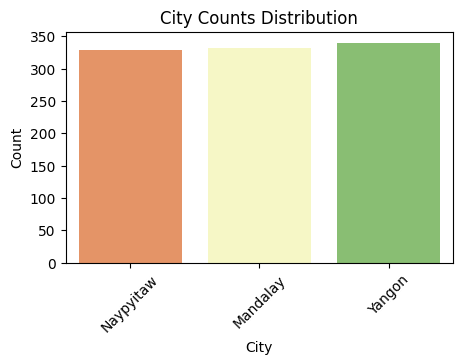

In [118]:


plt.figure(figsize=(5, 3))
sns.barplot(x=City_counts.index, y=City_counts.values, palette="RdYlGn") 
plt.xlabel('City')  
plt.ylabel('Count')  
plt.title('City Counts Distribution')  
plt.xticks(rotation=45)  
plt.show()


Note: we can see that branch A It is located in Yangon and branch B is located in Mandalay and Branch C is located in Naypyitaw

In [119]:
data.groupby('Branch')['City'].value_counts()

Branch  City     
A       Yangon       340
B       Mandalay     332
C       Naypyitaw    328
Name: count, dtype: int64

**Customer_Type**

**Insights and Hypotheses:**

**Balanced Distribution:** The counts of Normal and Member customers are quite close to each other, suggesting a relatively balanced distribution between the two types.

**Membership Impact:** The slightly higher count of Members (501) may indicate that membership has a small yet noticeable effect on customer acquisition. This could suggest that some benefits or features offered to Members are attracting customers to sign up.

**Customer Behavior:** The close numbers suggest that a majority of customers may not necessarily be Members, but a slight preference or incentive exists to encourage Membership.

**Retention Hypothesis:** Since Members may have access to exclusive benefits, the small difference could reflect customer retention strategies or membership sign-up rates.

In [120]:
Customer_type_counts=data['Customer type'].value_counts().sort_values().reset_index(name='Count')
Customer_type_counts

,Customer type,Count
0,Normal,499
1,Member,501


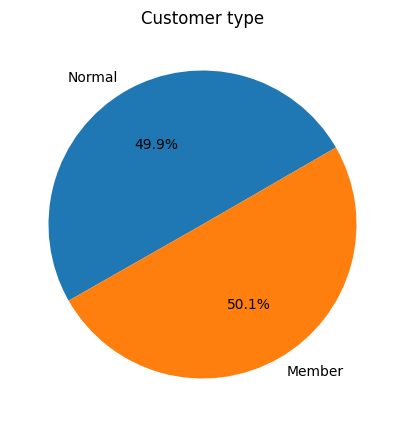

In [121]:
plt.figure(figsize=(6, 5))
plt.pie(Customer_type_counts['Count'], labels=Customer_type_counts['Customer type'], autopct='%1.1f%%', startangle=30)
plt.title('Customer type')
plt.show()

**Gender**

The data reflects a fairly even split between Male and Female customers, with a very small lean towards Female customers. This balance suggests that gender may not be a major differentiating factor in this customer segment, but small variations could exist depending on external factors like market trends or product appeal.

In [122]:
gender_counts=data.Gender.value_counts().sort_values().reset_index(name='Counts')
gender_counts

,Gender,Counts
0,Male,499
1,Female,501


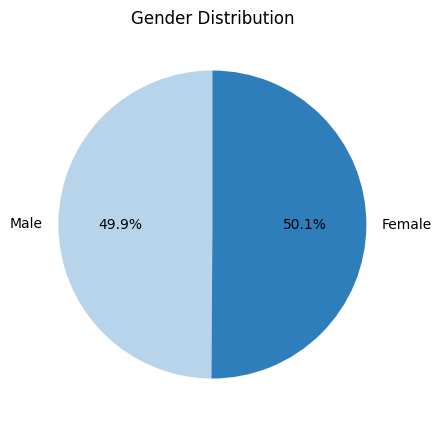

In [123]:
plt.figure(figsize=(6, 5))
plt.pie(gender_counts['Counts'], labels=gender_counts['Gender'], autopct='%1.1f%%', startangle=90, colors=plt.cm.Blues([0.3, 0.7]))  # Color range
plt.title('Gender Distribution')
plt.show()

**Proudect line**

Product Line Distribution Description:

Here are some hypotheses based on the given counts of product lines:

Fashion Accessories Preference Hypothesis: The highest count of Fashion Accessories (178) suggests that customers have a strong preference for trendy or aesthetic products, which may be influenced by seasonal fashion trends, promotions, or social influences.

Necessity-Driven Demand Hypothesis: The relatively high count for Food and Beverages (174) indicates that essential, consumable items tend to maintain consistent demand, reflecting daily or frequent purchasing habits.

Technology Appeal Hypothesis: The count for Electronic Accessories (170) suggests that tech-related products are popular among customers, possibly driven by the increasing use of electronics and mobile devices.

Lifestyle Influence Hypothesis: The counts for Home and Lifestyle (160) and Sports and Travel (166) may reflect customer interests and lifestyle choices, with home goods indicating a focus on personal or family spaces, while sports/travel items highlight active or adventurous behaviors.

Health Awareness Hypothesis: The Health and Beauty (152) count, being the lowest, might indicate that while there is interest in health and wellness, it is not as dominant compared to other categories, possibly reflecting a niche or competitive market space.

Balanced Demand Hypothesis: The overall distribution shows a relatively balanced spread across product lines, suggesting diverse customer interests without any one category dominating substantially. This could indicate effective marketing across multiple segments.

Each hypothesis can guide further exploration into customer behavior, marketing strategies, and product offerings.

In [124]:
Product_line=data['Product line'].value_counts().sort_values().reset_index(name='Counts')
Product_line

,Product line,Counts
0,Health and beauty,152
1,Home and lifestyle,160
2,Sports and travel,166
3,Electronic accessories,170
4,Food and beverages,174
5,Fashion accessories,178


C:\Users\NTC\AppData\Local\Temp\ipykernel_13900\1416934393.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data, y='Product line', palette='viridis')


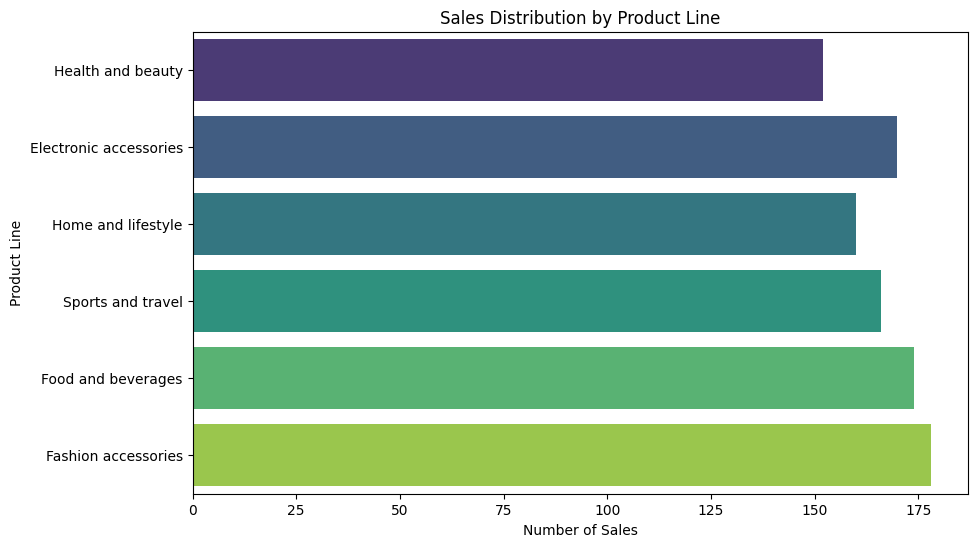

In [125]:
plt.figure(figsize=(10, 6))
sns.countplot(data=data, y='Product line', palette='viridis')
plt.title('Sales Distribution by Product Line')
plt.xlabel('Number of Sales')
plt.ylabel('Product Line')
plt.show()

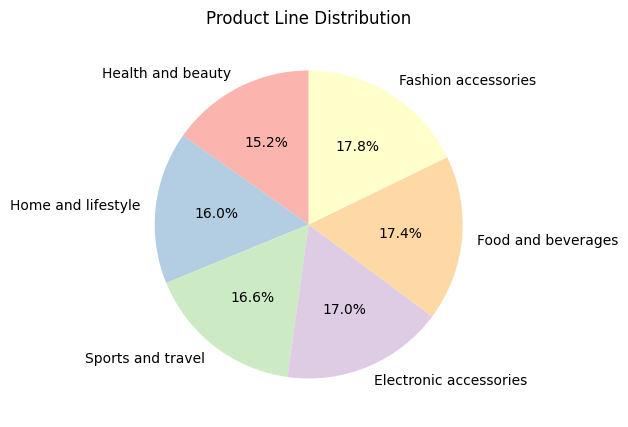

In [126]:

Product_line = data['Product line'].value_counts().sort_values().reset_index(name='Counts')
Product_line.columns = ['Product line', 'Counts']  # Rename columns for clarity
plt.figure(figsize=(8, 5))
plt.pie(Product_line['Counts'], labels=Product_line['Product line'], autopct='%1.1f%%', startangle=90, colors=plt.cm.Pastel1.colors)
plt.title('Product Line Distribution')
plt.show()


**Quantity**

Quantity Distribution Description:

Quantity = 10 (119 counts): This is the highest count in the distribution, indicating that a quantity of 10 is the most common among the data. This could reflect promotions, bulk purchase incentives, or a popular bundle size.

Quantity = 1 (112 counts): The second highest count suggests that single-unit purchases are also frequent, likely reflecting customers who prefer or need smaller quantities.

Quantity = 4 (109 counts): This relatively high count indicates that moderate-sized purchases, such as four units, are common, possibly due to certain product packaging or customer needs.

Quantities = 5 and 7 (102 counts each): These quantities show equal demand and indicate that mid-level purchases are popular, potentially reflecting a pattern where customers prefer buying in certain quantities for convenience or specific uses.

Quantity = 6 (98 counts): This count is slightly lower but suggests that purchases in this range still hold steady demand, potentially driven by promotional offers or customer buying habits.

Quantity = 9 (92 counts): This indicates a slightly less common quantity for purchases but still demonstrates some customer demand for near-maximum purchases.

Quantity = 2 (91 counts): Smaller quantities like two units are also fairly common, possibly reflecting customers trying new products or meeting smaller-scale needs.

Quantity = 3 (90 counts): Similar to the two-unit purchases, three units reflect steady, albeit slightly lower, customer demand compared to other small and mid-sized quantities.

Quantity = 8 (85 counts): This is the lowest count in the dataset, indicating that this quantity is less popular among customers. It may reflect an unconventional purchase amount or limited relevance to customer needs.

Overall, the distribution shows a range of customer preferences, with both smaller quantities and larger bulk purchases being popular, suggesting flexibility in customer buying patterns.

In [127]:
data['Quantity'].value_counts().sort_values().reset_index(name='count')


,Quantity,count
0,8,85
1,3,90
2,2,91
3,9,92
4,6,98
5,7,102
6,5,102
7,4,109
8,1,112
9,10,119


C:\Users\NTC\AppData\Local\Temp\ipykernel_13900\3718376580.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Quantity', y='Count', data=quantity_counts, palette='Blues')


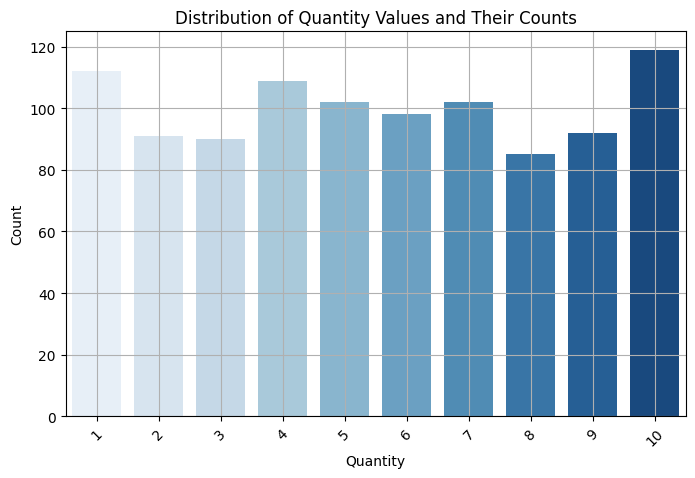

In [128]:
import matplotlib.pyplot as plt
import seaborn as sns

# Get the counts of each quantity value
quantity_counts = data['Quantity'].value_counts().sort_values().reset_index(name='count')
quantity_counts.columns = ['Quantity', 'Count']  # Rename columns for clarity

# Plotting the data
plt.figure(figsize=(8, 5))
sns.barplot(x='Quantity', y='Count', data=quantity_counts, palette='Blues')
plt.title('Distribution of Quantity Values and Their Counts')
plt.xlabel('Quantity')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


**Date and Time with total**

Date Range Description:

First Date (Earliest): The data starts from January 1, 2019, marking the earliest point of available data in the dataset. This represents the initial period for which sales or related records are being captured.

Last Date (Latest): The data extends up to March 30, 2019, which is the most recent date available in the dataset. This signifies the endpoint of the data collection period.

The dataset covers a time span of nearly three months, providing a window of daily sales, transactions, or activities over the first quarter of 2019. This period can be used to analyze trends, identify peaks, and examine sales behavior across different dates.

In [129]:

data['Date'] = pd.to_datetime(data['Date'])
print("First Date (Earliest):", data['Date'].min())
print("Last Date (Latest):", data['Date'].max())


First Date (Earliest): 2019-01-01 00:00:00
Last Date (Latest): 2019-03-30 00:00:00


Maximum and Minimum Total Sales Description:

Maximum Total Sales: On March 9, 2019, the total sales reached the highest value of 7,474.047. This date represents the peak sales day in the dataset, potentially indicating high customer demand, special promotions, or unique events that drove increased sales.

Minimum Total Sales: On February 13, 2019, the total sales recorded were the lowest at 934.2375. This date marks the least sales activity within the period, possibly due to lower customer engagement, reduced demand, or other factors impacting sales performance.

This contrast highlights variations in daily sales across the dataset and can provide insights into factors driving sales peaks and troughs.

In [130]:

daily_sales = data.groupby('Date')['Total'].sum()


max_sales_date = daily_sales.idxmax()
max_sales_total = daily_sales.max()


min_sales_date = daily_sales.idxmin()
min_sales_total = daily_sales.min()

max_sales_date, max_sales_total, min_sales_date, min_sales_total


(Timestamp('2019-03-09 00:00:00'),
 7474.0470000000005,
 Timestamp('2019-02-13 00:00:00'),
 934.2375)

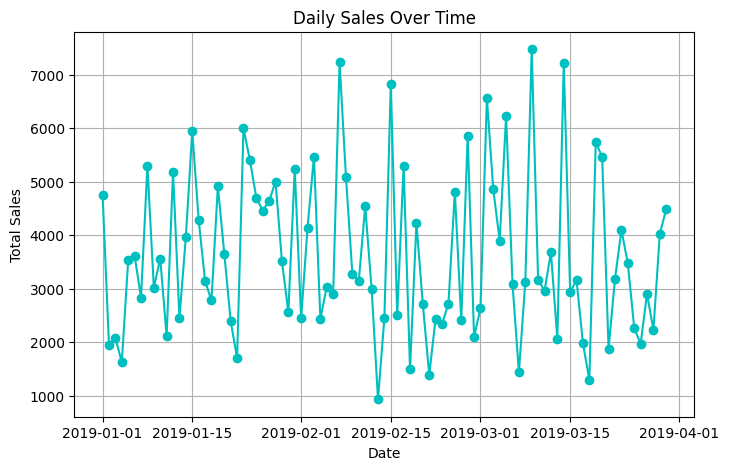

In [131]:
if 'Date' in data.columns:
    daily_sales = data.groupby('Date')['Total'].sum()
    plt.figure(figsize=(8, 5))
    plt.plot(daily_sales.index, daily_sales.values, marker='o', color='c')
    plt.title('Daily Sales Over Time')
    plt.xlabel('Date')
    plt.ylabel('Total Sales')
    plt.grid(True)
    plt.show()


Hourly Sales Distribution Description:

This data represents the total sales amounts grouped by the hour of the day, revealing fluctuations and trends in customer activity:

Peak Sales Hour (Hour 19): The highest total sales were recorded during the 19th hour (7 PM), with 39,699.513 units. This suggests that evenings experience the greatest customer activity, potentially due to end-of-day shopping behaviors.

Other High Sales Hours: The 13th hour (1 PM) follows closely with 34,723.227 units, indicating strong midday customer engagement, while hours 10 AM, 11 AM, 12 PM, 14 PM (2 PM), and 15 PM (3 PM) also reflect high sales, with totals ranging from 31,421.481 to 30,828.399 units. This mid-morning to afternoon range suggests a sustained interest during business hours.

Moderate Sales Hours: The 16th, 17th, and 18th hours (4 PM, 5 PM, and 6 PM) show moderate sales totals, ranging from 25,226.3235 to 26,030.340 units, indicating consistent yet lower activity in the late afternoon.

Lowest Sales Hour (Hour 20): The 20th hour (8 PM) records the lowest sales total in this list with 22,969.527 units, suggesting a gradual decline in activity during later evening hours.

The distribution suggests a general pattern of strong customer engagement from late morning through the evening, with peaks around early afternoon and a major peak at 7 PM. This pattern can help optimize staffing, promotions, and inventory during high-traffic hours.


In [132]:
data['Hour'] = pd.to_datetime(data['Time'], format='%H:%M').dt.hour
hourly_sales = data.groupby('Hour')['Total'].sum().sort_values()
hourly_sales

Hour
20    22969.5270
17    24445.2180
16    25226.3235
18    26030.3400
12    26065.8825
11    30377.3295
14    30828.3990
15    31179.5085
10    31421.4810
13    34723.2270
19    39699.5130
Name: Total, dtype: float64

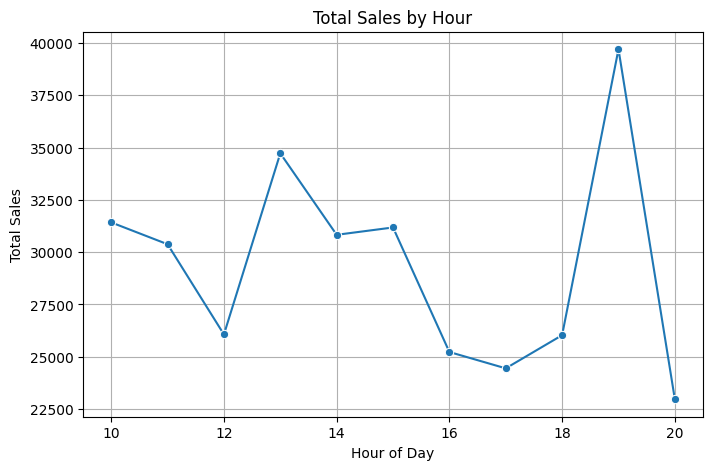

In [133]:
if 'Time' in data.columns:
    data['Hour'] = pd.to_datetime(data['Time'], format='%H:%M').dt.hour
    hourly_sales = data.groupby('Hour')['Total'].sum()
    plt.figure(figsize=(8, 5))
    sns.lineplot(x=hourly_sales.index, y=hourly_sales.values, marker='o')
    plt.title('Total Sales by Hour')
    plt.xlabel('Hour of Day')
    plt.ylabel('Total Sales')
    plt.grid(True)
    plt.show()

Monthly Sales Distribution Description:

This data shows the total sales grouped by month for the first quarter of 2019:

January 2019: The month recorded the highest total sales, amounting to 116,291.868 units. This indicates strong customer engagement, which could be due to the New Year's shopping period, sales promotions, or seasonal trends driving increased demand.

March 2019: With a total sales value of 109,455.507, March reflects continued strong performance, although slightly lower than January. This suggests sustained customer interest or successful end-of-quarter sales initiatives.

February 2019: The lowest total sales were recorded in February, amounting to 97,219.374 units. This decline may reflect fewer promotions, a shorter month, or other factors reducing sales volume compared to the other months.

Overall, the data reveals a positive trend of strong sales throughout the quarter, with a noticeable peak at the beginning of the year and a dip in the middle month. This could guide planning for sales campaigns and resource allocation in future periods.

In [134]:
data['Month'] = data['Date'].dt.to_period('M')
monthly_sales = data.groupby('Month')['Total'].sum().sort_values()
monthly_sales 

Month
2019-02     97219.374
2019-03    109455.507
2019-01    116291.868
Freq: M, Name: Total, dtype: float64

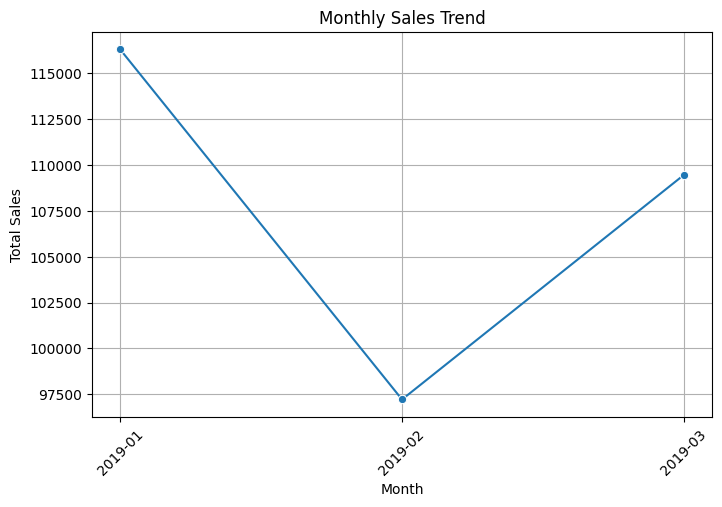

In [135]:
if 'Date' in data.columns:
    data['Month'] = data['Date'].dt.to_period('M')
    monthly_sales = data.groupby('Month')['Total'].sum()

    plt.figure(figsize=(8, 5))
    sns.lineplot(x=monthly_sales.index.astype(str), y=monthly_sales.values, marker='o')
    plt.title('Monthly Sales Trend')
    plt.xlabel('Month')
    plt.ylabel('Total Sales')
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.show()



**Payment**

Payment Method Distribution Description:

This data represents the distribution of different payment methods used by customers:

Ewallet (345 counts): The highest usage of 345 counts for Ewallet suggests that customers increasingly prefer digital wallets for transactions, likely due to convenience, security, and faster checkout options.

Cash (344 counts): Cash payments are just slightly behind Ewallet, with 344 counts, indicating that cash remains a commonly used method, although it might be seeing a slight decline in comparison to digital payment methods.

Credit Card (311 counts): Credit Card payments have the lowest count with 311 counts, reflecting a steady but slightly less popular option compared to Ewallet and Cash. This could be due to the increasing preference for more immediate or contactless payment options.

Overall, the distribution shows that Ewallet and Cash are the most popular payment methods, while Credit Cards have a relatively lower usage, possibly due to the growing trend of digital and mobile payment options.

In [136]:
data.Payment.value_counts().sort_values().reset_index(name='counts')

,Payment,counts
0,Credit card,311
1,Cash,344
2,Ewallet,345


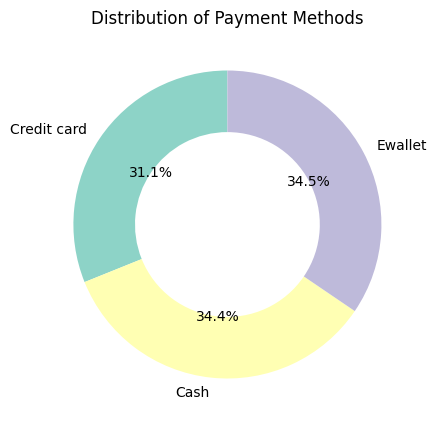

In [137]:
payment_counts = data.Payment.value_counts().sort_values().reset_index(name='counts')
payment_counts.rename(columns={'index': 'Payment'}, inplace=True)

plt.figure(figsize=(8, 5))
plt.pie(x=payment_counts['counts'], labels=payment_counts['Payment'], autopct='%1.1f%%', startangle=90, colors=plt.cm.Set3.colors, wedgeprops={'width': 0.4})
plt.title('Distribution of Payment Methods')
plt.show()


**Rating**

The array represents a set of ratings with values ranging from 4.0 to 10.0, showing a distribution of ratings across a variety of values, with the majority of ratings falling between 5.0 and 9.9.

In [138]:
data['Rating'].unique()

array([ 9.1,  9.6,  7.4,  8.4,  5.3,  4.1,  5.8,  8. ,  7.2,  5.9,  4.5,
        6.8,  7.1,  8.2,  5.7,  4.6,  6.9,  8.6,  4.4,  4.8,  5.1,  9.9,
        6. ,  8.5,  6.7,  7.7,  7.5,  7. ,  4.7,  7.6,  7.9,  6.3,  5.6,
        9.5,  8.1,  6.5,  6.1,  6.6,  5.4,  9.3, 10. ,  6.4,  4.3,  4. ,
        8.7,  9.4,  5.5,  8.3,  7.3,  4.9,  4.2,  9.2,  7.8,  5.2,  9. ,
        8.8,  6.2,  9.8,  9.7,  5. ,  8.9])

Distribution of Rating Frequencies: Most and Least Frequent Ratings

The most frequent rating is 6.0, appearing 26 times, while the least frequent rating is 10.0, occurring only 5 times. This suggests that most ratings are clustered around the middle of the scale, with fewer instances of the highest rating.


In [139]:
# Get the frequency count of each rating
rating_counts = data['Rating'].value_counts()

# Find the most frequent and least frequent ratings
most_frequent_rating = rating_counts.idxmax()
least_frequent_rating = rating_counts.idxmin()

# Display the most frequent and least frequent ratings with their counts
most_frequent_count = rating_counts.max()
least_frequent_count = rating_counts.min()

print(f"Most Frequent Rating: {most_frequent_rating} with {most_frequent_count} occurrences")
print(f"Least Frequent Rating: {least_frequent_rating} with {least_frequent_count} occurrences")


Most Frequent Rating: 6.0 with 26 occurrences
Least Frequent Rating: 10.0 with 5 occurrences


In [140]:


# Find the most recent rating and the lowest recent rating
most_recent_rating = data.loc[data['Rating'].idxmax()]
most_recent_rating

Invoice ID                         285-68-5083
Branch                                       C
City                                 Naypyitaw
Customer type                           Member
Gender                                  Female
Product line                 Sports and travel
Unit price                               24.74
Quantity                                     3
Tax 5%                                   3.711
Total                                   77.931
Date                       2019-02-15 00:00:00
Time                                     17:47
Payment                            Credit card
cogs                                     74.22
gross margin percentage               4.761905
gross income                             3.711
Rating                                    10.0
Hour                                        17
Month                                  2019-02
Name: 60, dtype: object

In [141]:
least_recent_rating = data.loc[data['Rating'].idxmin()]
least_recent_rating

Invoice ID                         510-95-6347
Branch                                       B
City                                  Mandalay
Customer type                           Member
Gender                                  Female
Product line                Food and beverages
Unit price                               48.52
Quantity                                     3
Tax 5%                                   7.278
Total                                  152.838
Date                       2019-03-05 00:00:00
Time                                     18:17
Payment                                Ewallet
cogs                                    145.56
gross margin percentage               4.761905
gross income                             7.278
Rating                                     4.0
Hour                                        18
Month                                  2019-03
Name: 72, dtype: object

Descriptive Statistics for Sales Data

This table shows the descriptive statistics for the sales data of various products. Below is a summary of each column in the dataset:

In [142]:
# Select specific columns and describe them
data[['Unit price', 'Quantity', 'Tax 5%', 'Total', 'cogs', 'gross margin percentage',
       'gross income']].describe()


,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000
mean,55.672130,5.510000,15.379369,322.966749,307.58738,4.761905,15.379369
std,26.494628,2.923431,11.708825,245.885335,234.17651,0.000000,11.708825
min,10.080000,1.000000,0.508500,10.678500,10.17000,4.761905,0.508500
25%,32.875000,3.000000,5.924875,124.422375,118.49750,4.761905,5.924875
50%,55.230000,5.000000,12.088000,253.848000,241.76000,4.761905,12.088000
75%,77.935000,8.000000,22.445250,471.350250,448.90500,4.761905,22.445250
max,99.960000,10.000000,49.650000,1042.650000,993.00000,4.761905,49.650000


<Figure size 800x500 with 0 Axes>

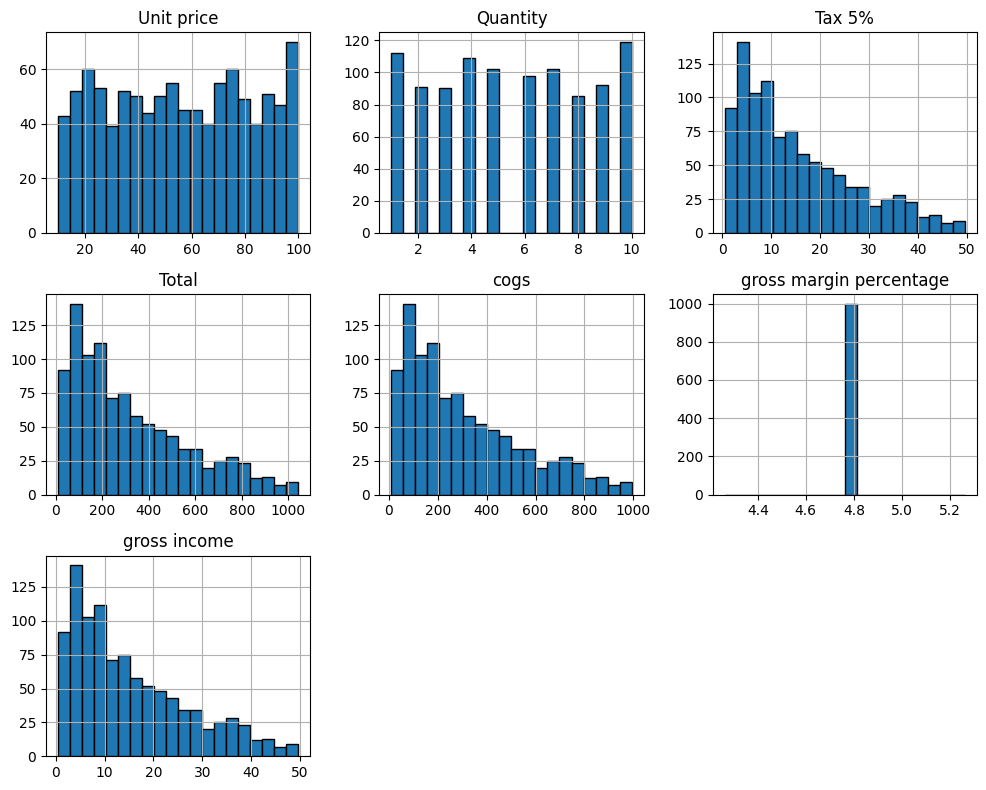

In [143]:

plt.figure(figsize=(8, 5))
data[['Unit price', 'Quantity', 'Tax 5%', 'Total', 'cogs', 'gross margin percentage',
       'gross income',]].hist(bins=20, edgecolor='black', figsize=(10, 8))
plt.tight_layout()
plt.show()


**Correlation Matrix Heatmap**

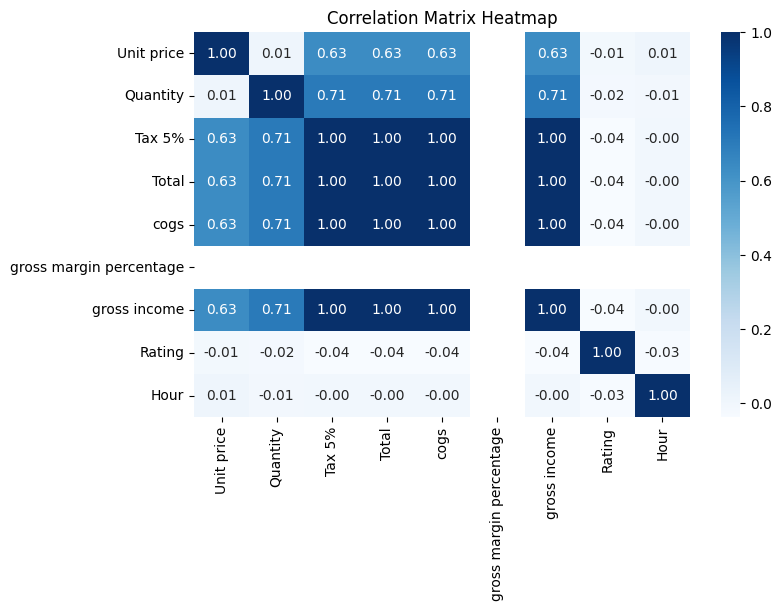

In [144]:
numeric_corr = data.select_dtypes(include=['number']).corr() 
plt.figure(figsize=(8, 5))  
sns.heatmap(numeric_corr , annot=True, cmap='Blues', fmt='.2f')
plt.title('Correlation Matrix Heatmap')
plt.show()


**corrlation between city and Customer type**

Here's a description including the comparison with percentages:

Mandalay:  "Normal" customers (50.3%) and  "Member" customers (49.7%). "Normal" customers are slightly more than "Member" customers.

Naypyitaw:  "Normal" customers (48.5%) and  "Member" customers (51.5%). "Member" customers are more than "Normal" customers.

Yangon: "Normal" customers (50.9%) and "Member" customers (49.1%). "Normal" customers are slightly more than "Member" customers.

This breakdown shows the distribution and relative engagement of customer types in each city using percentages for a clearer comparison.

In [145]:
grouped_data=data.groupby('City')['Customer type'].value_counts().reset_index(name='count')
grouped_data

,City,Customer type,count
0,Mandalay,Normal,167
1,Mandalay,Member,165
2,Naypyitaw,Member,169
3,Naypyitaw,Normal,159
4,Yangon,Normal,173
5,Yangon,Member,167


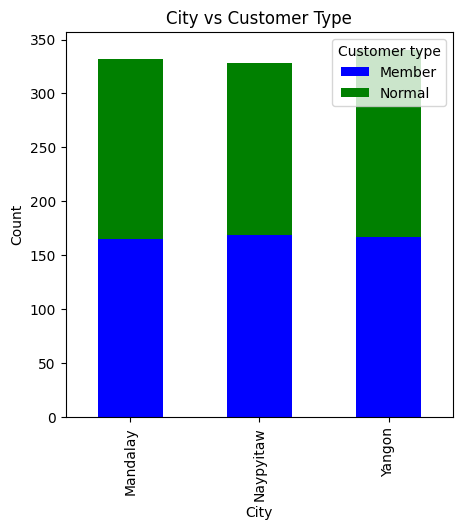

In [146]:
pd.crosstab(data.City, data['Customer type']).plot(kind='bar',
                                                   stacked=True,
                                                   figsize=(5, 5),
                                                   color=['blue', 'green'])
plt.title('City vs Customer Type')
plt.xlabel('City')
plt.ylabel('Count')
plt.show()


**Customer Type Distribution Across City and Gender**

Among Member customers, Naypyitaw has the highest number of females (96), while Yangon has the highest number of males (87).
Among Normal customers, Yangon has the highest count of both female (81) and male (92) customers.
In general, there is a near-even distribution of customer types across genders and cities, though some variation is present in the counts, indicating differing levels of engagement based on gender and city.

In [147]:

grouped_data = data.groupby(['Customer type', 'City', 'Gender']).size().reset_index(name='count')
grouped_data


,Customer type,City,Gender,count
0,Member,Mandalay,Female,85
1,Member,Mandalay,Male,80
2,Member,Naypyitaw,Female,96
3,Member,Naypyitaw,Male,73
4,Member,Yangon,Female,80
5,Member,Yangon,Male,87
6,Normal,Mandalay,Female,77
7,Normal,Mandalay,Male,90
8,Normal,Naypyitaw,Female,82
9,Normal,Naypyitaw,Male,77


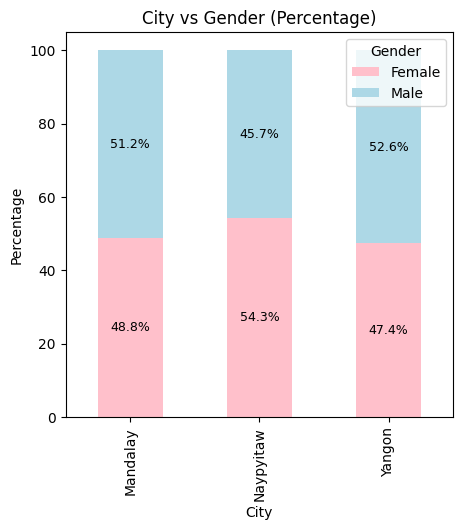

In [148]:
import matplotlib.pyplot as plt

# Normalize along the index to get percentages
crosstab_percent = pd.crosstab(data.City, data.Gender, normalize='index') * 100

# Plot the normalized values
ax = crosstab_percent.plot(kind='bar',
                           stacked=True,
                           figsize=(5, 5),
                           color=['pink', 'lightblue'])
plt.title('City vs Gender (Percentage)')
plt.xlabel('City')
plt.ylabel('Percentage')

# Adding percentage labels inside the bars
for container in ax.containers:
    ax.bar_label(container, fmt='%.1f%%', label_type='center', fontsize=9, color='black')

plt.show()


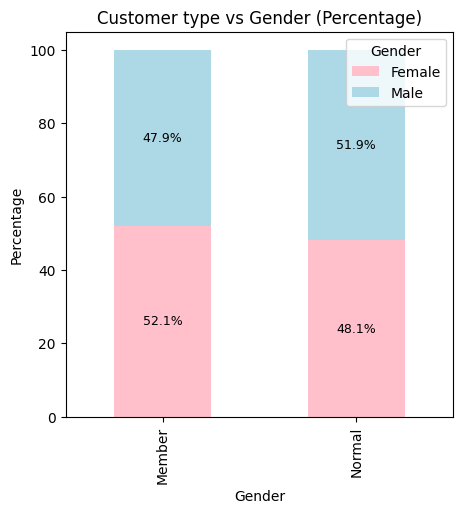

In [149]:
crosstab_percent = pd.crosstab(data['Customer type'], data.Gender, normalize='index') * 100

# Plot the normalized values
ax = crosstab_percent.plot(kind='bar',
                           stacked=True,
                           figsize=(5, 5),
                           color=['pink', 'lightblue'])
plt.title('Customer type vs Gender (Percentage)')
plt.xlabel('Gender')
plt.ylabel('Percentage')

# Adding percentage labels inside the bars
for container in ax.containers:
    ax.bar_label(container, fmt='%.1f%%', label_type='center', fontsize=9, color='black')


**Gender Distribution Across Product Lines**

Product Preference by Gender: Female customers are more inclined towards purchasing items in categories such as Fashion Accessories and Food and Beverages, indicating a potential preference for lifestyle and consumable products.

Balanced Interest in Electronic Accessories: The nearly even distribution of male and female customers in the Electronic Accessories category suggests that both genders show similar interest and demand for tech products.

Health and Beauty Gender Bias: Male customers have a higher representation in the Health and Beauty category, possibly indicating targeted marketing, product availability, or cultural preferences that influence higher male engagement in this category.







In [150]:
data.groupby('Product line')['Gender'].value_counts().reset_index(name='count')

,Product line,Gender,count
0,Electronic accessories,Male,86
1,Electronic accessories,Female,84
2,Fashion accessories,Female,96
3,Fashion accessories,Male,82
4,Food and beverages,Female,90
5,Food and beverages,Male,84
6,Health and beauty,Male,88
7,Health and beauty,Female,64
8,Home and lifestyle,Male,81
9,Home and lifestyle,Female,79


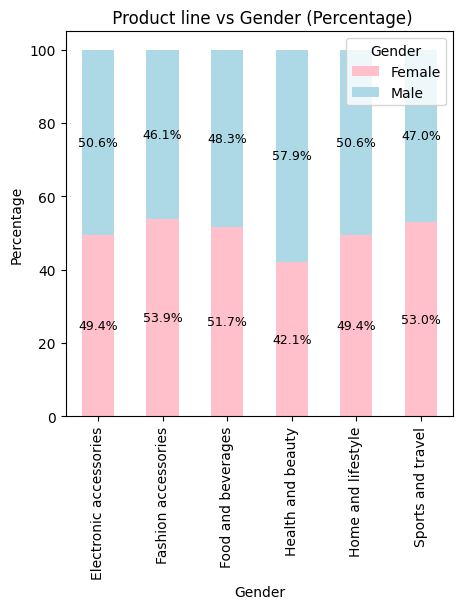

In [151]:
crosstab_percent = pd.crosstab(data['Product line'], data.Gender, normalize='index') * 100

# Plot the normalized values
ax = crosstab_percent.plot(kind='bar',
                           stacked=True,
                           figsize=(5, 5),
                           color=['pink', 'lightblue'])
plt.title(' Product line vs Gender (Percentage)')
plt.xlabel('Gender')
plt.ylabel('Percentage')

# Adding percentage labels inside the bars
for container in ax.containers:
    ax.bar_label(container, fmt='%.1f%%', label_type='center', fontsize=9, color='black')


**Total Revenue by Branch**

Branch C has the highest total sum, indicating it performs better in terms of the measured metric.
Branches A and B have nearly equal totals, with only a small difference of 2.70 units between them, indicating comparable performance.

In [152]:

branch_revenue = data.groupby('Branch')['Total'].sum().sort_values(ascending=False).reset_index(name='sum')
branch_revenue

,Branch,sum
0,C,110568.7065
1,A,106200.3705
2,B,106197.6720


C:\Users\NTC\AppData\Local\Temp\ipykernel_13900\1007334308.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=branch_revenue,x='Branch', y='sum', palette='Blues_d')


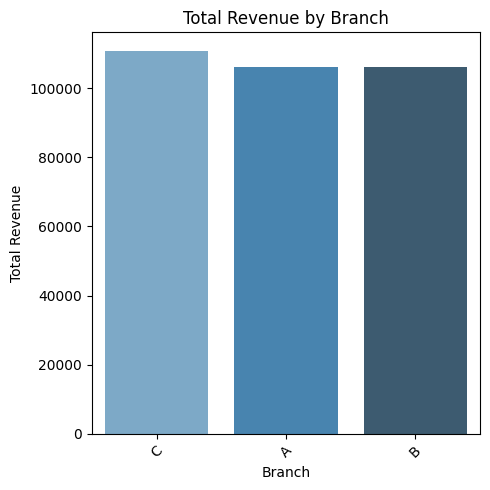

In [153]:

# Assuming branch_revenue is already created
plt.figure(figsize=(5, 5))
sns.barplot(data=branch_revenue,x='Branch', y='sum', palette='Blues_d')

plt.title('Total Revenue by Branch')
plt.xlabel('Branch')
plt.ylabel('Total Revenue')
plt.xticks(rotation=45)  # Rotate branch names for better readability
plt.tight_layout()
plt.show()


**______________________________________________________________________________________________________________**

**Revenue by product line**

Food and Beverages leads in total revenue, followed closely by Sports and Travel and Electronic Accessories.

Health and Beauty has the lowest revenue among the product lines, indicating potentially lower sales or demand compared to the other categories.

The revenue differences between the top categories (Food and Beverages, Sports and Travel, and Electronic Accessories) are relatively small, suggesting a similar performance among these product lines.

In [154]:
product_line_revenue = data.groupby('Product line')['Total'].sum().sort_values(ascending=False).reset_index(name='sum')
product_line_revenue

,Product line,sum
0,Food and beverages,56144.8440
1,Sports and travel,55122.8265
2,Electronic accessories,54337.5315
3,Fashion accessories,54305.8950
4,Home and lifestyle,53861.9130
5,Health and beauty,49193.7390


C:\Users\NTC\AppData\Local\Temp\ipykernel_13900\502704524.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=product_line_revenue,x='Product line', y='sum', palette='Greens')


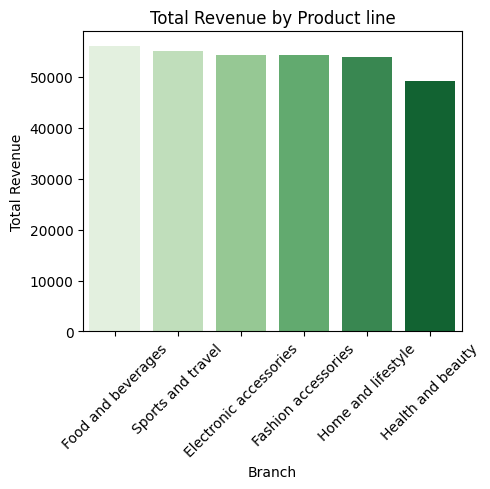

In [155]:
plt.figure(figsize=(5, 5))
sns.barplot(data=product_line_revenue,x='Product line', y='sum', palette='Greens')

plt.title('Total Revenue by Product line')
plt.xlabel('Branch')
plt.ylabel('Total Revenue')
plt.xticks(rotation=45)  # Rotate branch names for better readability
plt.tight_layout()
plt.show()


**Distribution of Total by (Branch,City,Customer Type,Gender,Product line)**

C:\Users\NTC\AppData\Local\Temp\ipykernel_13900\467391231.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data, x=col, y='Total', palette='Blues')


<Figure size 500x500 with 0 Axes>

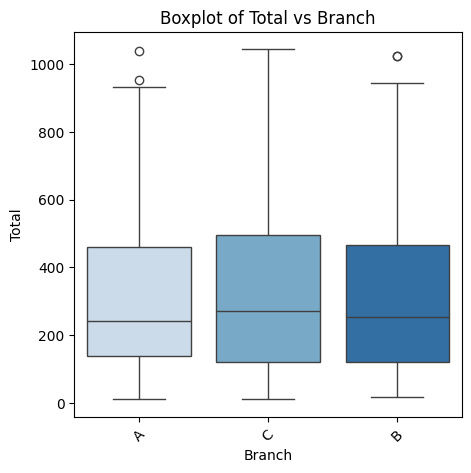

C:\Users\NTC\AppData\Local\Temp\ipykernel_13900\467391231.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data, x=col, y='Total', palette='Blues')


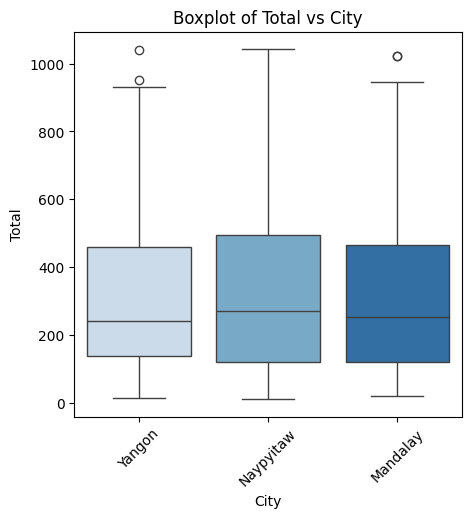

C:\Users\NTC\AppData\Local\Temp\ipykernel_13900\467391231.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data, x=col, y='Total', palette='Blues')


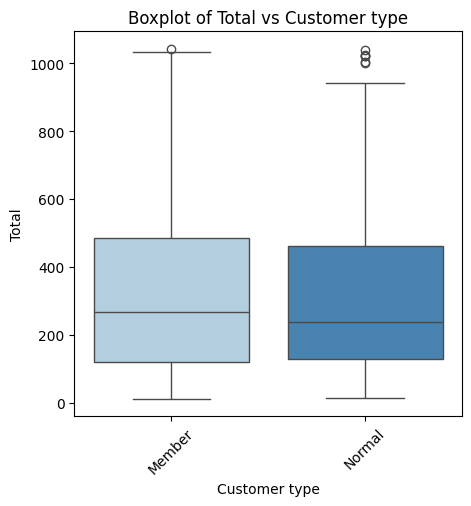

C:\Users\NTC\AppData\Local\Temp\ipykernel_13900\467391231.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data, x=col, y='Total', palette='Blues')


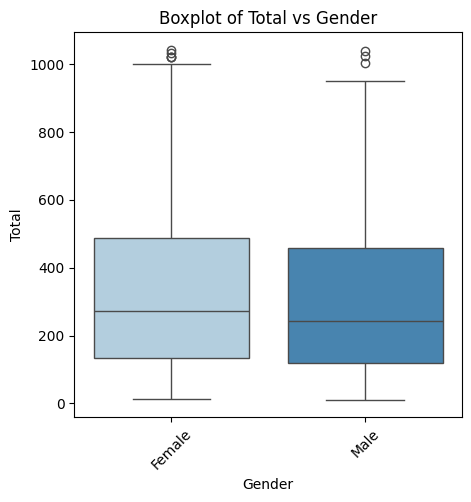

C:\Users\NTC\AppData\Local\Temp\ipykernel_13900\467391231.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=data, x=col, y='Total', palette='Blues')


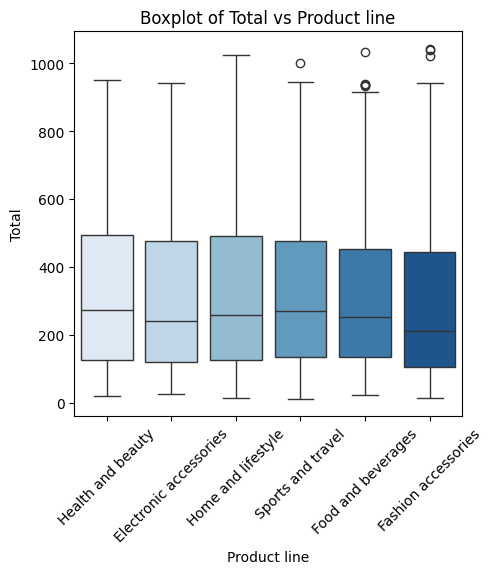

In [161]:
import seaborn as sns
import matplotlib.pyplot as plt


plt.figure(figsize=(5, 5))


categorical_columns = ['Branch', 'City', 'Customer type', 'Gender', 'Product line']


for col in categorical_columns:
    plt.figure(figsize=(5, 5))
    sns.boxplot(data=data, x=col, y='Total', palette='Blues')
    plt.title(f'Boxplot of Total vs {col}')
    plt.xticks(rotation=45) 
    plt.show()


**Relationships between quantity and total sales**

Direct Proportionality: In general, we observe a direct relationship between quantity and total, meaning that as the quantity purchased increases, the total amount paid also 

increases. This implies that the price per unit is constant or nearly constant.

Distribution: The data is generally distributed around an upward-sloping straight line, indicating a linear relationship between the variables.

Variance: Despite the general relationship, there is some variability in the data, meaning that some points fall above or below the expected straight line. This variability may be due to factors other than quantity, such as product type, discounts, or data recording errors.

<Axes: xlabel='Quantity', ylabel='Total'>

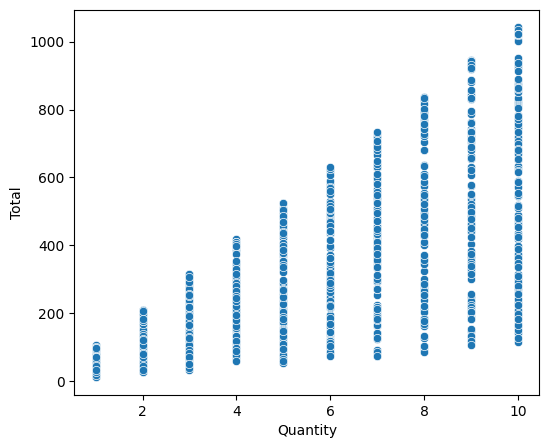

In [ ]:
plt.figure(figsize=(6,5))
sns.scatterplot(x='Quantity', y='Total', data=data)


______________________________________________________________________________________________________________________________________________

#### **Preprocessing**

**Dublicate Data**

theres no dublicate data

In [ ]:
data.duplicated().sum()

0

**Handling Outliers**

Using Square Root Transformation to handle outliers is an effective approach to reducing the impact of large values in your data without removing them. Here's how this transformation affects the data:

Reducing Large Values:

The square root transformation lessens the relative impact of large values (outliers), making the distribution of data more balanced.
For example, if you have a very large value in the Total column, applying the square root makes it closer to smaller values, thus reducing its influence on statistical analysis.
Achieving a More Normal Distribution:

Square root transformation is often used to convert non-normally distributed data into a more normal or balanced distribution.
This can be beneficial in cases where you need to assume a normal distribution of the data, such as for certain statistical tests.
Preserving Zero Values:

Zero values remain unchanged when applying the square root transformation. If you have zeros in your data, they will stay as zeros after the transformation.
Negative values are usually handled with clip(lower=0) to ensure no complex numbers are created, as the square root of negative numbers is undefined in the real number set.

<Axes: >

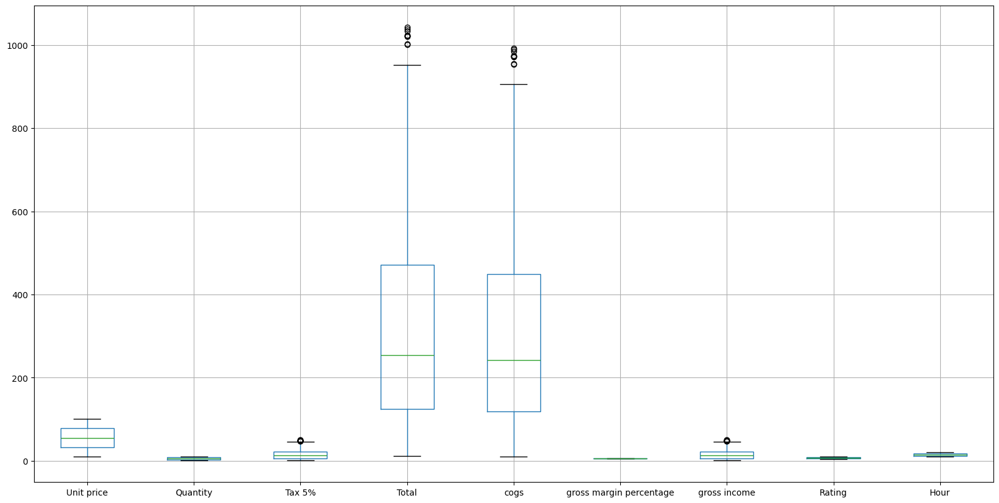

In [ ]:
plt.figure(figsize=(20,10))
data.boxplot()

In [ ]:

columns=['Tax 5%','Total','cogs','gross income']
for col in columns:
    data[col] = np.sqrt(data[col].clip(lower=0))  # تطبيق الجذر التربيعي


<Axes: >

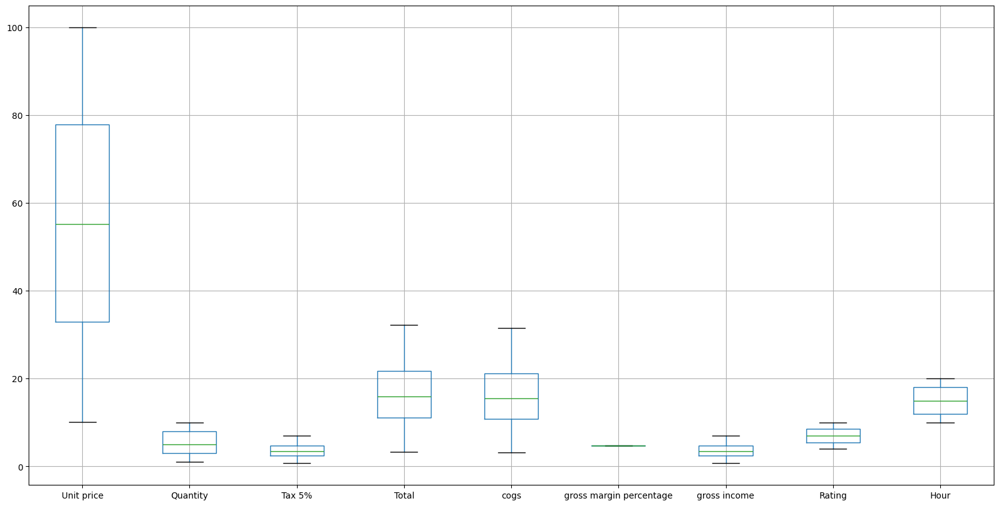

In [ ]:
plt.figure(figsize=(20,10))
data.boxplot()

________________________________________________________________________________________________________________________________________________

#### **Preprossesing**

In [ ]:
data = data.drop('Invoice ID', axis=1)


In [ ]:
import datetime
data['Time'] = datetime.datetime.now()
data['Month'] = datetime.datetime.now().date()


In [ ]:
for col in data.columns:
    if data[col].dtype == 'object':
        data = pd.get_dummies(data, columns=[col], drop_first=True)  # One-Hot Encoding with drop_first


In [ ]:
data.head()

,Unit price,Quantity,Tax 5%,Total,Date,Time,cogs,gross margin percentage,gross income,Rating,...,City_Yangon,Customer type_Normal,Gender_Male,Product line_Fashion accessories,Product line_Food and beverages,Product line_Health and beauty,Product line_Home and lifestyle,Product line_Sports and travel,Payment_Credit card,Payment_Ewallet
0,74.69,7,5.112876,23.430141,2019-01-05,2024-11-19 12:17:05.363824,22.865476,4.761905,5.112876,9.1,...,True,False,False,False,False,True,False,False,False,True
1,15.28,5,1.954482,8.956562,2019-03-08,2024-11-19 12:17:05.363824,8.740709,4.761905,1.954482,9.6,...,False,True,False,False,False,False,False,False,False,False
2,46.33,7,4.026847,18.453333,2019-03-03,2024-11-19 12:17:05.363824,18.008609,4.761905,4.026847,7.4,...,True,True,True,False,False,False,True,False,True,False
3,58.22,8,4.825764,22.114430,2019-01-27,2024-11-19 12:17:05.363824,21.581474,4.761905,4.825764,8.4,...,True,False,True,False,False,True,False,False,False,True
4,86.31,7,5.496226,25.186872,2019-02-08,2024-11-19 12:17:05.363824,24.579870,4.761905,5.496226,5.3,...,True,True,True,False,False,False,False,True,False,True


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 24 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Unit price                        1000 non-null   float64       
 1   Quantity                          1000 non-null   int64         
 2   Tax 5%                            1000 non-null   float64       
 3   Total                             1000 non-null   float64       
 4   Date                              1000 non-null   datetime64[ns]
 5   Time                              1000 non-null   datetime64[us]
 6   cogs                              1000 non-null   float64       
 7   gross margin percentage           1000 non-null   float64       
 8   gross income                      1000 non-null   float64       
 9   Rating                            1000 non-null   float64       
 10  Hour                              1000 non-null  

In [ ]:
x = data.drop(columns=['Total'])
y = data['Total']

In [ ]:

correlation = x.corrwith(y)
threshold = 0.1
columns_to_drop = correlation[abs(correlation) < threshold].index
x = x.drop(columns=columns_to_drop)
x.head()


c:\Users\NTC\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\NTC\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


,Unit price,Quantity,Tax 5%,cogs,gross margin percentage,gross income
0,74.69,7,5.112876,22.865476,4.761905,5.112876
1,15.28,5,1.954482,8.740709,4.761905,1.954482
2,46.33,7,4.026847,18.008609,4.761905,4.026847
3,58.22,8,4.825764,21.581474,4.761905,4.825764
4,86.31,7,5.496226,24.579870,4.761905,5.496226


In [ ]:
x.shape

(1000, 6)

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = scaler.fit_transform(x.values)
x

array([[ 0.71816014,  0.5099302 ,  0.99356752,  0.99356752,  0.        ,
         0.99356752],
       [-1.52530319, -0.17453987, -1.11426398, -1.11426398,  0.        ,
        -1.11426398],
       [-0.35278112,  0.5099302 ,  0.26877981,  0.26877981,  0.        ,
         0.26877981],
       ...,
       [-0.89995809, -1.54348001, -1.57657912, -1.57657912,  0.        ,
        -1.57657912],
       [ 0.38320778, -1.54348001, -1.20794379, -1.20794379,  0.        ,
        -1.20794379],
       [ 1.23361671,  0.5099302 ,  1.29229081,  1.29229081,  0.        ,
         1.29229081]])

In [ ]:
from sklearn.preprocessing import StandardScaler

y = y.values.reshape(-1, 1)

scaler = StandardScaler()
y = scaler.fit_transform(y)

y


array([[ 0.99356752],
       [-1.11426398],
       [ 0.26877981],
       [ 0.80195649],
       [ 1.24940559],
       [ 1.22980393],
       [ 0.61421268],
       [ 1.6287584 ],
       [-1.14781701],
       [-0.50453837],
       [-1.28292169],
       [-0.91119614],
       [-0.13220809],
       [ 0.68268191],
       [ 1.56833373],
       [ 1.12008595],
       [ 0.85935563],
       [ 0.69615225],
       [-0.50750746],
       [-1.07889049],
       [ 0.67657235],
       [ 0.00578096],
       [-1.20262124],
       [-0.45696306],
       [ 0.01472032],
       [ 0.64227897],
       [-1.55464962],
       [-0.44259828],
       [ 0.71802468],
       [-0.18512334],
       [ 0.81881879],
       [ 1.5370154 ],
       [ 1.44476547],
       [-0.34461417],
       [ 0.55728613],
       [-1.18697235],
       [ 0.22192517],
       [ 1.07448197],
       [ 0.70935102],
       [-0.10216329],
       [-1.02895725],
       [-0.8377888 ],
       [ 0.62037433],
       [ 1.7746862 ],
       [-1.59125254],
       [ 0

In [ ]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.1,random_state=0)

______________________________________

#### **Machine Learning**

 ##### **Algorithm's**
**LinearRegression**

hese results indicate that your linear regression model performs excellently on the test data used, but there may be points that require deeper analysis to ensure it is a suitable model.

Mean Squared Error (MSE): The value is extremely low, indicating that the differences between the actual values and the predicted values are very small.

Mean Absolute Error (MAE): The value is close to zero, reflecting that the model is able to predict the true values with high accuracy.

R-squared: Its value is 1, meaning the model explains 100% of the variance in the independent data, which is an indicator that the model fits the data perfectly.

In [ ]:
lr_model = LinearRegression()
lr_model.fit(x_train, y_train)
y_pred = lr_model.predict(x_test)


mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Linear Regression Mean Squared Error: {mse}')
print(f'Linear Regression Mean Absolute Error: {mae}')
print(f'Linear Regression R-squared: {r2}')


Linear Regression Mean Squared Error: 8.721810657587085e-31
Linear Regression Mean Absolute Error: 7.933324136510933e-16
Linear Regression R-squared: 1.0


................................................................................

**RndomForestRegressor**

Conclusion:

-The Random Forest model is performing very well on the given data.

-The Mean Squared Error (MSE) is extremely small, indicating minimal error in the model's predictions.

-The R-squared (R²) value is very close to 1, suggesting that the model is able to explain nearly all of the variance in the target variable.

This implies that the model has a high level of accuracy and precision, making it a very reliable model for this specific dataset.

In [ ]:
rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42)

rf_regressor.fit(x_train, y_train)
y_pred_rf = rf_regressor.predict(x_test)
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

print(f"Random Forest - Mean Squared Error: {mse_rf}")
print(f"Random Forest - R-squared: {r2_rf}")

c:\Users\NTC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Random Forest - Mean Squared Error: 1.0669017082026105e-05
Random Forest - R-squared: 0.9999891567733526


............................................................................................

**DecisionTreeRegressor**

Conclusion:
-The Decision Tree model is performing exceptionally well, with a very low Mean Squared Error (MSE) and a very high R-squared (R²) value.

-The MSE is very close to zero, indicating minimal prediction error.

-The R² value of 0.99999 shows that the model explains almost all the variance in the target variable, making it a highly accurate model for this dataset.

Both the Decision Tree and Random Forest models appear to be excellent choices for this problem, as they demonstrate near-perfect predictive performance.

In [ ]:
# Initialize the Decision Tree Regressor
dt_regressor = DecisionTreeRegressor(random_state=42)

dt_regressor.fit(x_train, y_train)
y_pred_dt = dt_regressor.predict(x_test)
mse_dt = mean_squared_error(y_test, y_pred_dt)
r2_dt = r2_score(y_test, y_pred_dt)

print(f"Decision Tree - Mean Squared Error: {mse_dt}")
print(f"Decision Tree - R-squared: {r2_dt}")


Decision Tree - Mean Squared Error: 1.2206742776973923e-05
Decision Tree - R-squared: 0.9999875939388289


...........................................................................................

**SVR**

Conclusion:

-The SVR model is still performing very well with a low MSE and a high R², but its performance (in terms of error and explained variance) is not as strong as that of the Random Forest and Decision Tree models, which both achieve near-perfect results.

-While SVR is a robust model, it may not be as well-suited for this particular dataset as the Random Forest or Decision Tree models, which achieve nearly perfect accuracy and very low error.

In [ ]:
from sklearn.svm import SVR
svr_regressor = SVR(kernel='rbf')  


svr_regressor.fit(x_train, y_train)


y_pred_svr = svr_regressor.predict(x_test)

mse_svr = mean_squared_error(y_test, y_pred_svr)
r2_svr = r2_score(y_test, y_pred_svr)

print(f"SVR - Mean Squared Error: {mse_svr}")
print(f"SVR - R-squared: {r2_svr}")


SVR - Mean Squared Error: 0.0035695860631589473
SVR - R-squared: 0.9963721277768816


c:\Users\NTC\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


.......................................................................................................

**KNeighborsRegressor**

Conclusion:

-The KNN model is performing exceptionally well, with a low MSE and a very high R², indicating accurate predictions and excellent fit to the data.

-The KNN model is a strong performer, showing near-perfect predictive power, with only a small gap between its performance and that of the Random Forest and Decision Tree models.

-While there is a slight difference in performance (particularly in terms of MSE and R²), the KNN model is still highly effective for this problem and can be considered a good alternative to the other models.

In [ ]:
knn = KNeighborsRegressor(n_neighbors=5)  # You can adjust the n_neighbors hyperparameter
knn.fit(x_train, y_train)
y_pred_knn = knn.predict(x_test)
mse_knn = mean_squared_error(y_test, y_pred_knn)
r2_knn = r2_score(y_test, y_pred_knn)

print(f"knn - Mean Squared Error: {mse_knn}")
print(f"knn - R-squared: {r2_knn}")


knn - Mean Squared Error: 0.0005160279339334919
knn - R-squared: 0.999475546078804


In [ ]:
import joblib 
joblib.dump(knn, 'knn_model.pkl')  # Save the trained model to a file

# Load the model (for testing)
loaded_knn = joblib.load('knn_model.pkl')

.........................................................................................................

In [ ]:
# Print comparison of all models
print("Comparison of Models:")
print(f"Decision Tree - MSE: {mse_dt}, R-squared: {r2_dt}")
print(f"Random Forest - MSE: {mse_rf}, R-squared: {r2_rf}")
print(f"Linear Regression - MSE: {mse}, R-squared: {r2}")
print(f'SVR_MSE:{mse_svr},R_squared:{r2_svr}')
print(f"KNeighborsRegressor - MSE: {mse_knn}, R-squared: {r2_knn}")

Comparison of Models:
Decision Tree - MSE: 1.2206742776973923e-05, R-squared: 0.9999875939388289
Random Forest - MSE: 1.0669017082026105e-05, R-squared: 0.9999891567733526
Linear Regression - MSE: 8.721810657587085e-31, R-squared: 1.0
SVR_MSE:0.0035695860631589473,R_squared:0.9963721277768816
KNeighborsRegressor - MSE: 0.0005160279339334919, R-squared: 0.999475546078804


..................................................................................................

**Visulisiation For All Algorithm's**

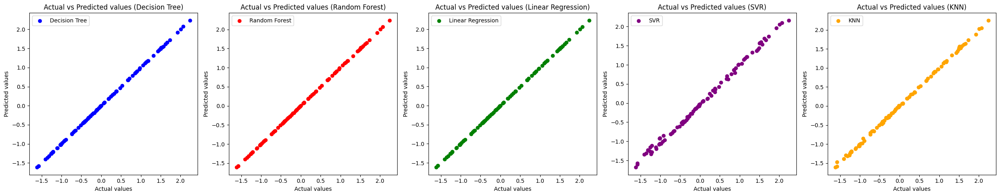

In [ ]:
ig, axes = plt.subplots(1, 5, figsize=(25, 5))

# Plotting Decision Tree predictions
axes[0].scatter(y_test, y_pred_dt, color='blue', label='Decision Tree')
axes[0].set_xlabel('Actual values')
axes[0].set_ylabel('Predicted values')
axes[0].set_title('Actual vs Predicted values (Decision Tree)')
axes[0].legend()

# Plotting Random Forest predictions
axes[1].scatter(y_test, y_pred_rf, color='red', label='Random Forest')
axes[1].set_xlabel('Actual values')
axes[1].set_ylabel('Predicted values')
axes[1].set_title('Actual vs Predicted values (Random Forest)')
axes[1].legend()

# Plotting Linear Regression predictions
axes[2].scatter(y_test, y_pred, color='green', label='Linear Regression')
axes[2].set_xlabel('Actual values')
axes[2].set_ylabel('Predicted values')
axes[2].set_title('Actual vs Predicted values (Linear Regression)')
axes[2].legend()

# Plotting SVR predictions
axes[3].scatter(y_test, y_pred_svr, color='purple', label='SVR')
axes[3].set_xlabel('Actual values')
axes[3].set_ylabel('Predicted values')
axes[3].set_title('Actual vs Predicted values (SVR)')
axes[3].legend()

# Plotting KNN predictions
axes[4].scatter(y_test, y_pred_knn, color='orange', label='KNN')
axes[4].set_xlabel('Actual values')
axes[4].set_ylabel('Predicted values')
axes[4].set_title('Actual vs Predicted values (KNN)')
axes[4].legend()

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plots
plt.show()

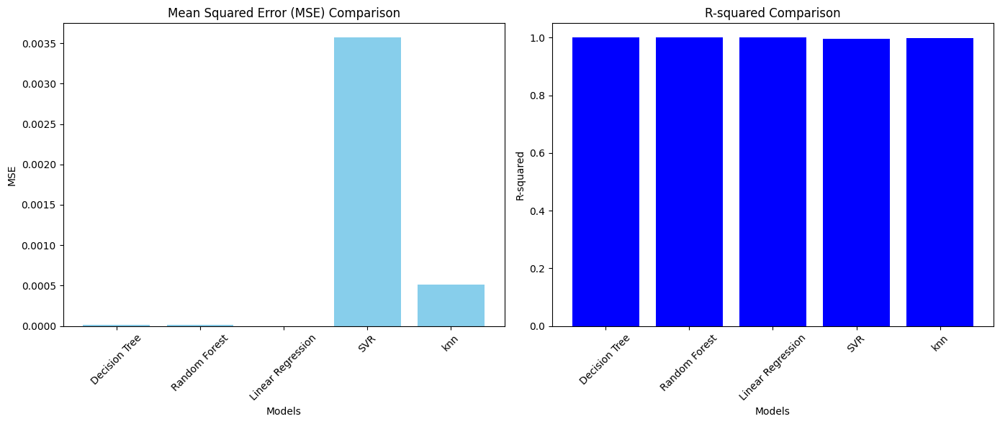

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Define the models and their corresponding MSE and R-squared values
models = ['Decision Tree', 'Random Forest', 'Linear Regression', 'SVR','knn']
mse_values = [mse_dt, mse_rf, mse, mse_svr,mse_knn]
r2_values = [r2_dt, r2_rf, r2, r2_svr,r2_knn]

# Create a figure with two subplots
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Plotting MSE values
ax[0].bar(models, mse_values, color='skyblue')
ax[0].set_title('Mean Squared Error (MSE) Comparison')
ax[0].set_xlabel('Models')
ax[0].set_ylabel('MSE')
ax[0].tick_params(axis='x', rotation=45)

# Plotting R-squared values
ax[1].bar(models, r2_values, color='Blue')
ax[1].set_title('R-squared Comparison')
ax[1].set_xlabel('Models')
ax[1].set_ylabel('R-squared')
ax[1].tick_params(axis='x', rotation=45)




# Show the plots
plt.tight_layout()
plt.show()


_______________________________________